## Project 4- Unsupervised Learning By Bappa Bhalsing

In [1]:
# Import Library
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
from sklearn.metrics import classification_report


In [2]:
vdf=pd.read_csv('vehicle.csv')
vdf.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [3]:
vdf.shape

(846, 19)

##### Data frame having 846 Rows and 19 Columns

In [4]:
vdf.groupby(["class"]).count()  # count the instances of each class in the data to check if data is skewed towards a class

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,218,214,215,216,217,218,218,218,217,218,218,218,216,217,214,218,218,218
car,429,428,429,426,428,429,428,428,428,429,427,427,429,426,427,428,428,429
van,199,199,198,198,199,199,199,199,198,199,198,199,199,199,199,199,199,199


##### Car has maximum poppulation than van & bus
##### Van & Bus has equivalent range and cummulative equivalent to car numbers
##### Data sets indicates that Car is prime aspect

In [5]:
# Checking Data type of columns and other information
vdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

##### Most of columns having missing value.

In [6]:
#Checking missing values in columns
vdf.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

##### Most  of columns having missing values and need clear before further processing.

In [7]:
#Missing values to be replace with median
vdf = vdf.groupby(vdf.columns, axis = 1).apply(lambda x: x.fillna(x.median()))

##### All missing values are filled with median of respective columns

In [8]:
# Rechecking Missing values and data information
vdf.isna().sum().sum()

0

##### No Missing Value or NaN value observed

In [9]:
vdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    846 non-null float64
distance_circularity           846 non-null float64
radius_ratio                   846 non-null float64
pr.axis_aspect_ratio           846 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  846 non-null float64
elongatedness                  846 non-null float64
pr.axis_rectangularity         846 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                846 non-null float64
scaled_variance.1              846 non-null float64
scaled_radius_of_gyration      846 non-null float64
scaled_radius_of_gyration.1    846 non-null float64
skewness_about                 846 non-null float64
skewness_about.1               846 non-null float64
skewness_about.2               846 non-null float64
hollows_ratio    

##### Now Dataset has no missing values

In [10]:
# 5 Point Summary of dataframe
vdf.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


##### Columns like compactness, circularity, Pr.Axis aspest ratio, Max Lenght aspect ratio, Pr axis rectangularity have mean and median near to equal value indicates less presence of outliers.

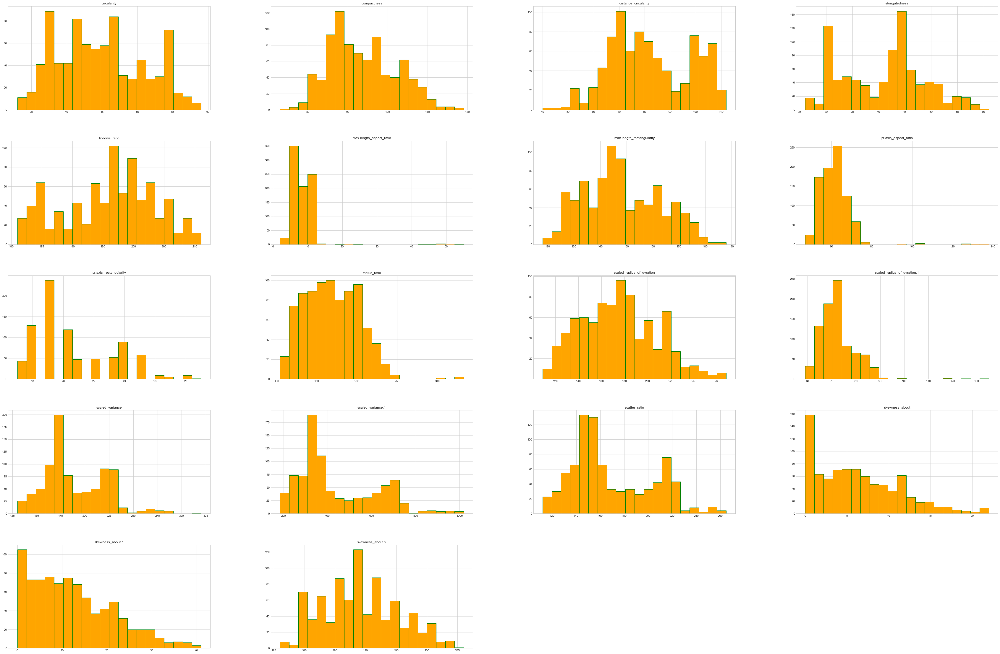

In [11]:
plt.style.use('seaborn-whitegrid')

vdf.hist(bins=20, figsize=(60,40), color='orange', edgecolor = 'green')
plt.show()

**Conclusion**
##### From above Histogram most of ditribution is normal but uneven & variation in nature. Also right skewness observed.
##### Some variable clearly indicates presence of Outlier values and need to evaluate them by plotting Boxplot


In [12]:
vdf.skew()

compactness                    0.381271
circularity                    0.264928
distance_circularity           0.108718
radius_ratio                   0.397572
pr.axis_aspect_ratio           3.835392
max.length_aspect_ratio        6.778394
scatter_ratio                  0.608710
elongatedness                  0.046951
pr.axis_rectangularity         0.774406
max.length_rectangularity      0.256359
scaled_variance                0.655598
scaled_variance.1              0.845345
scaled_radius_of_gyration      0.279910
scaled_radius_of_gyration.1    2.089979
skewness_about                 0.780813
skewness_about.1               0.689014
skewness_about.2               0.249985
hollows_ratio                 -0.226341
dtype: float64

##### All atributes are positively skewed except hollows Ratio attributes

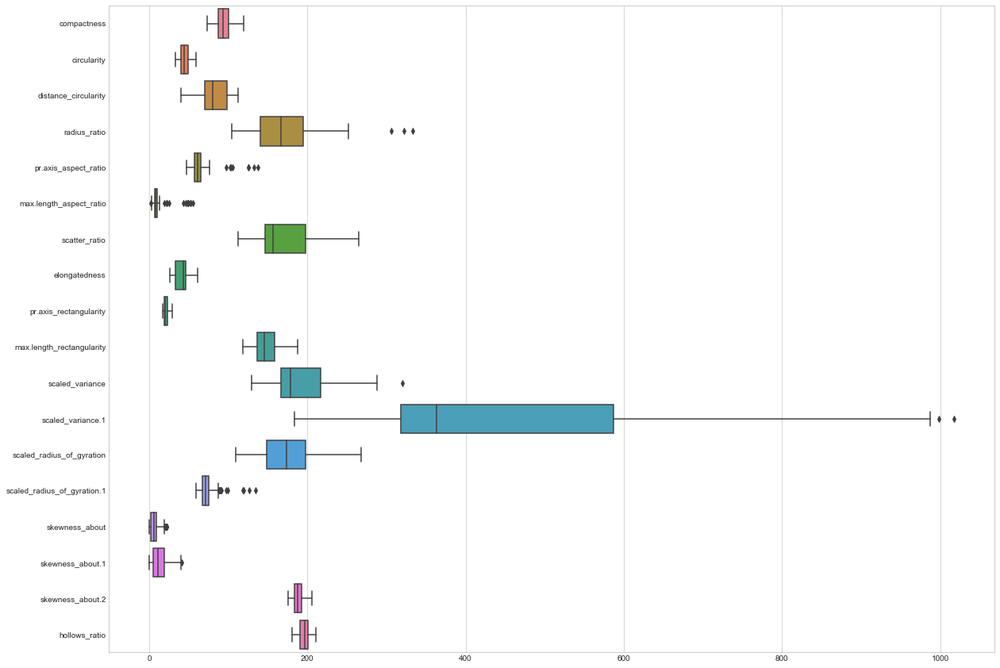

In [13]:
plt.figure(figsize= (20,15))
sns.boxplot(data=vdf, orient="h", palette="husl")

##### From above Boxplot presence of outliers in eight variable are clearly visible.

### Outliers - Removal from dataframe

In [14]:
vdf.shape

(846, 19)

In [15]:
from scipy.stats import iqr

Q1 = vdf.quantile(0.25)
Q3 = vdf.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

compactness                     13.00
circularity                      9.00
distance_circularity            28.00
radius_ratio                    54.00
pr.axis_aspect_ratio             8.00
max.length_aspect_ratio          3.00
scatter_ratio                   51.00
elongatedness                   13.00
pr.axis_rectangularity           4.00
max.length_rectangularity       22.00
scaled_variance                 50.00
scaled_variance.1              268.50
scaled_radius_of_gyration       49.00
scaled_radius_of_gyration.1      8.00
skewness_about                   7.00
skewness_about.1                14.00
skewness_about.2                 9.00
hollows_ratio                   10.75
dtype: float64


In [16]:
vdf1 = vdf[~((vdf < (Q1 - 1.5 * IQR)) |(vdf > (Q3 + 1.5 * IQR))).any(axis=1)]
vdf1.shape

(813, 19)

##### After removal of outliers Data shape has been chnaged and now only 813 rows are remained

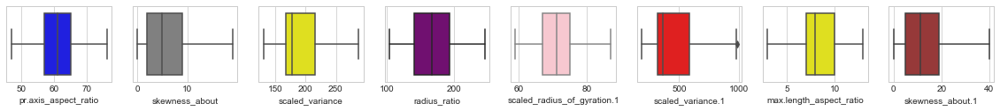

In [17]:
plt.figure(figsize= (20,15))
plt.subplot(8,8,1)
sns.boxplot(x= vdf1['pr.axis_aspect_ratio'], color='blue')

plt.subplot(8,8,2)
sns.boxplot(x= vdf1.skewness_about, color='grey')

plt.subplot(8,8,3)
sns.boxplot(x= vdf1.scaled_variance, color='yellow')
plt.subplot(8,8,4)
sns.boxplot(x= vdf1.radius_ratio, color='purple')

plt.subplot(8,8,5)
sns.boxplot(x= vdf1['scaled_radius_of_gyration.1'], color='pink')

plt.subplot(8,8,6)
sns.boxplot(x= vdf1['scaled_variance.1'], color='red')

plt.subplot(8,8,7)
sns.boxplot(x= vdf1['max.length_aspect_ratio'], color='yellow')

plt.subplot(8,8,8)
sns.boxplot(x= vdf1['skewness_about.1'], color='brown')

plt.show()


##### Boxplot confirms that outliers has been removed

### Pair Plot and Covariance matrix

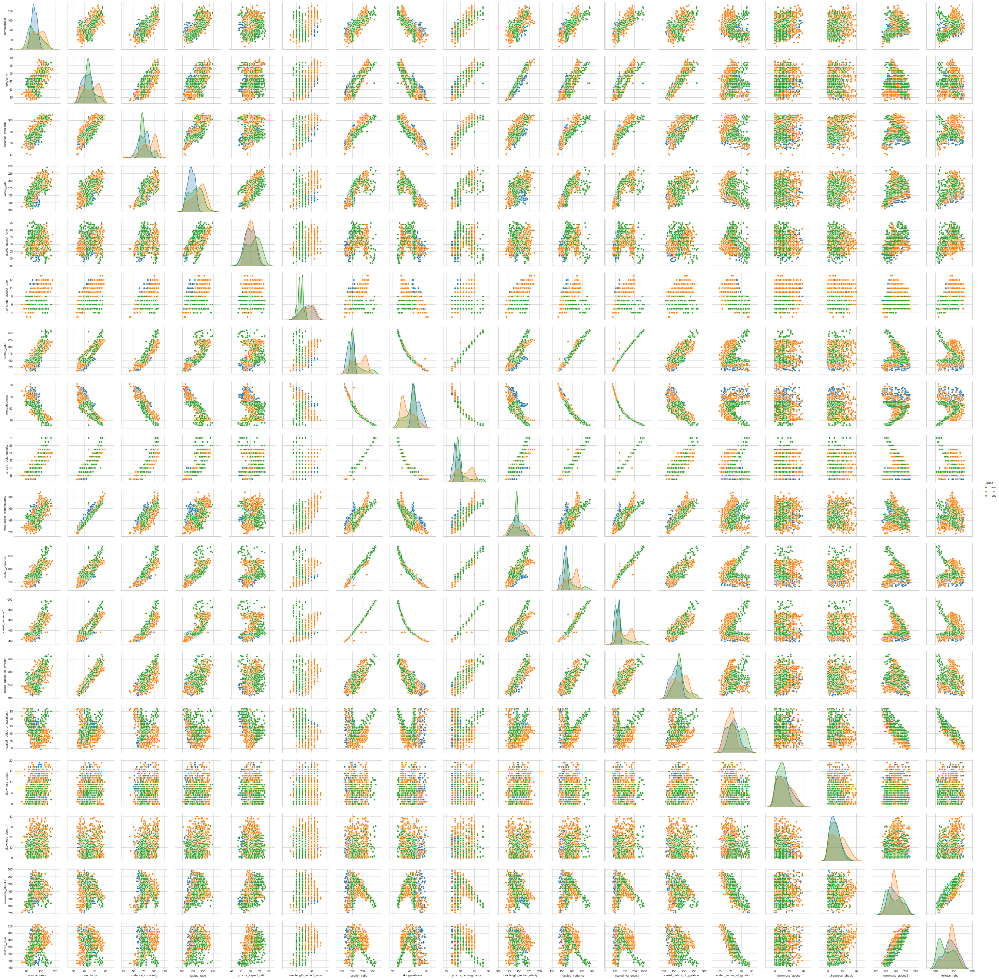

In [18]:
sns.pairplot(vdf1, diag_kind='kde', hue ='class')

**Inference of Pairplot**
##### Pairing of Compactness, Circularity, distance circularity , Radius Ratio, Pr axis aspect ratio have visible correlation
##### Scaled radius of gyration, Compactness, Circularity, distance circularity are corrected with each other.
##### Other features also seen limited correlation with each other.
##### Car category have double gaussian ditribution in Diaginal Plots


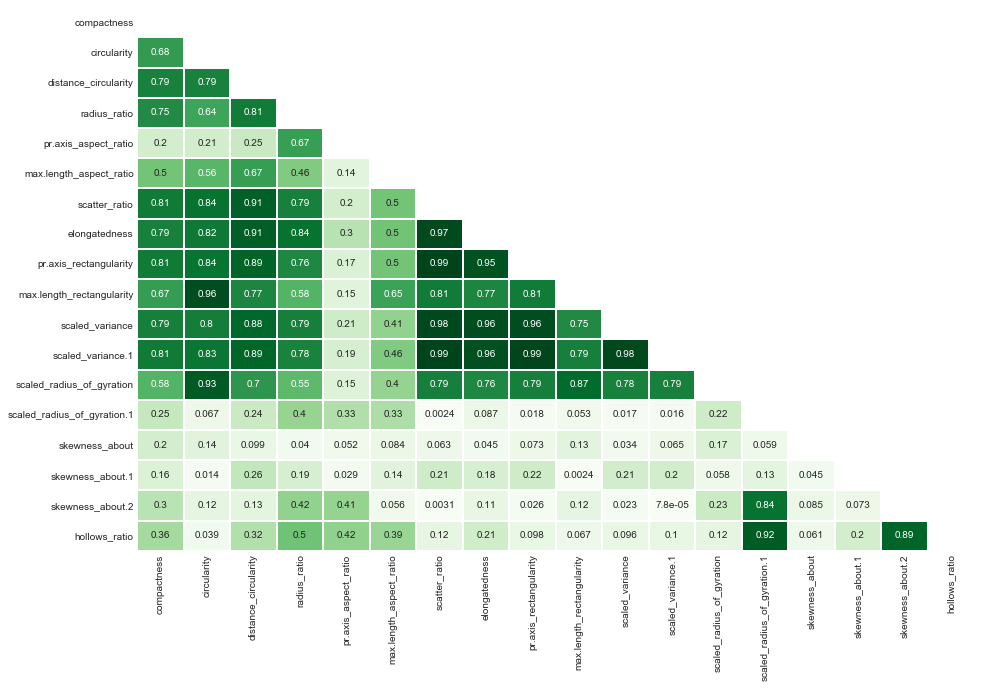

In [19]:
corr=abs(vdf1.corr())
lower_triangle = np.tril(corr, k = -1)
mask=lower_triangle==0
plt.figure(figsize=(15,10))
sns.heatmap(lower_triangle,cmap= 'Greens', annot=True,xticklabels = corr.index, yticklabels = corr.columns,cbar= False, linewidths= 1, mask=mask);
plt.yticks(rotation = 0)
plt.show()

**Inference of Correlation Matrix**
###### Circularity have >0.90 correlation with Scaled Radius of Gyration & Max Lenght rectagularity and >0.80 correlation with scattered ratio, elongatedness & pe axis rectangularity.
###### Distance Circularity have >0.90 correlation scatter Ratio & elongatedness
###### Pr axis aspect ratio & max lenght aspect ratio have less correlation with other variables.
###### Skewness about & skewness about 1 also less correlation with other variables
###### 50 % variable are highly correlated with each other.


car    416
bus    208
van    189
Name: class, dtype: int64


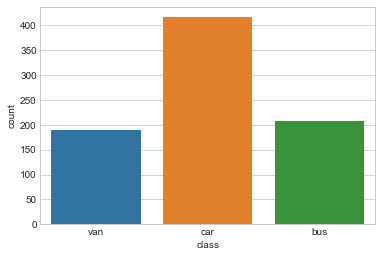

In [20]:
sns.countplot(x=vdf1['class']);
print(vdf1['class'].value_counts());

##### Checking final counts of Class category

### Split Data into Test & Training Set

In [21]:
from sklearn.model_selection import train_test_split

In [22]:
vdf1['class']=vdf1['class'].replace(to_replace=['van','car','bus'], value=[1,2,3])

C:\Users\bappa.bhalsing\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [23]:
X=vdf1.drop('class', axis=1)
y=vdf1['class']



In [24]:
X.shape

(813, 18)

In [25]:
y.shape

(813,)

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=100)

### Grid Search

No Learning happens on Grid Search Topic- So not performed any model fitting

### Train Model on SVM

In [27]:
from sklearn import svm

In [28]:
clf = svm.SVC(gamma=0.025, C=3, random_state=100)    

In [29]:
clf.fit(X_train , y_train)

SVC(C=3, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.025, kernel='rbf',
    max_iter=-1, probability=False, random_state=100, shrinking=True, tol=0.001,
    verbose=False)

In [30]:
y_pred = clf.predict(X_test)

In [31]:
Test_Orinal_Accuracy=clf.score(X_test, y_test)
Test_Orinal_Accuracy

0.5409836065573771

##### Score for SVM on Raw data on test set is 54.09 %

In [32]:
Train_Orinal_Accuracy=clf.score(X_train, y_train)
Train_Orinal_Accuracy

1.0

##### Score for SVM on Raw data on test set is 100 %

In [33]:
print("Accuracy on training set: {:.2f}".format(clf.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(clf.score(X_test, y_test)))

Accuracy on training set: 1.00
Accuracy on test set: 0.54


##### Score of Test & Train infered that there is high gap between both score.

In [34]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       1.00      0.03      0.07        59
           2       0.52      1.00      0.69       123
           3       1.00      0.11      0.20        62

    accuracy                           0.54       244
   macro avg       0.84      0.38      0.32       244
weighted avg       0.76      0.54      0.41       244



##### This report indicated that the model is not tunned because precision of Car category is 54 % and for van and Bus is 100 %. Recall, f1 Score shows non adequacy in the result with respect precision level.
##### Macro Average and Weighted Average is also varied result. It indicate that model need to tunned further using PCA.

##### K-fold cross-validation

In [35]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

In [36]:
kfold = KFold(n_splits=50, random_state=100)
scores = cross_val_score(clf, X, y, cv=kfold)

scores

C:\Users\bappa.bhalsing\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


array([0.23529412, 0.58823529, 0.41176471, 0.47058824, 0.47058824,
       0.58823529, 0.23529412, 0.64705882, 0.70588235, 0.41176471,
       0.47058824, 0.52941176, 0.52941176, 0.5       , 0.5625    ,
       0.3125    , 0.375     , 0.5       , 0.5625    , 0.5       ,
       0.75      , 0.5       , 0.4375    , 0.6875    , 0.6875    ,
       0.5       , 0.5       , 0.5625    , 0.625     , 0.8125    ,
       0.75      , 0.3125    , 0.75      , 0.6875    , 0.6875    ,
       0.5       , 0.5625    , 0.5625    , 0.75      , 0.5       ,
       0.375     , 0.6875    , 0.625     , 0.4375    , 0.4375    ,
       0.5625    , 0.625     , 0.5625    , 0.6875    , 0.5625    ])

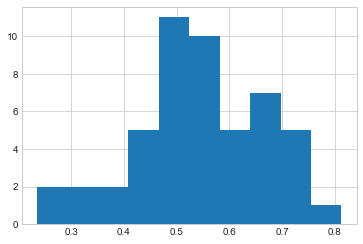

95.0% confidence interval is 25.3% and 75.0%


In [37]:
# plot scores
plt.hist(scores)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(scores, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(scores, p))
print('%.1f%% confidence interval is %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [38]:
A=scores.mean()
A

0.5458823529411765

##### Average Cross Validation score of SVM model is 54.58 %

##### 95 % confidence interval of this model is minimum accuracy of 25.3 %  to Maximum accuracy 75.0 % 

In [39]:
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report,roc_auc_score

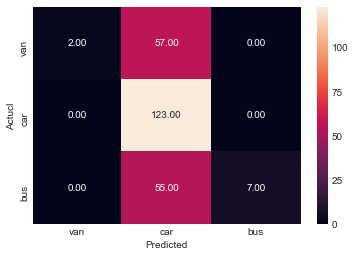

[[  2  57   0]
 [  0 123   0]
 [  0  55   7]]


In [40]:
 cm = confusion_matrix( y_test, y_pred, [1,2,3] )
sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = ['van','car','bus'] , yticklabels = ['van','car','bus'] )
plt.ylabel('Actucl')
plt.xlabel('Predicted')
plt.show()
print(cm)


Confusion Matrix inference

   - Our model on this data set has correctly classified 2 van out of 59 actuals vans and has errored in 57 case where it has wrongly predicted van to be a Car.  
   - svm model has correcly classified 123 cars. 
   - model has correctly classified 7 buses , It has classifying wrongly 56 buses to be car. 

### PCA

In [41]:
from sklearn.decomposition import PCA
from scipy.stats import zscore

In [42]:
XScaled=X.apply(zscore)
XScaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.172252,0.524273,0.054413,0.320514,1.923745,0.917511,-0.210249,0.143541,-0.226542,0.763046,-0.393996,-0.345187,0.297468,-0.323897,-0.038246,0.379490,-0.324770,0.176759
1,-0.324348,-0.621958,0.118805,-0.852833,-0.743688,0.429013,-0.607056,0.532106,-0.618411,-0.342266,-0.592152,-0.626997,-0.505992,-0.000795,0.609548,0.155190,0.002617,0.449185
2,1.289602,0.851768,1.535438,1.303589,0.856772,0.917511,1.163315,-1.151676,0.949066,0.693964,1.158224,1.127127,1.409952,0.160756,1.689205,-0.405562,-0.161076,0.040546
3,-0.076048,-0.621958,-0.009980,-0.282015,0.323285,0.429013,-0.759675,0.661628,-0.618411,-0.342266,-0.922412,-0.747772,-1.463965,-1.454753,-0.038246,-0.293412,1.639554,1.538891
5,1.662052,-0.130716,1.535438,0.130242,-1.988490,-1.036481,2.628450,-1.928806,2.908414,1.453866,3.040704,2.979021,2.769655,2.099367,-0.254177,-0.405562,-1.306932,-1.730226


##### All indenpedent variable has under equivalent dimensional level after application of Z score

In [43]:
# Creat dummy data sets for K Mean application
X1Scaled=XScaled

In [44]:
vdf2=vdf1

In [45]:
pca = PCA(n_components=18, random_state=100)
pca.fit(XScaled)

PCA(copy=True, iterated_power='auto', n_components=18, random_state=100,
    svd_solver='auto', tol=0.0, whiten=False)

##### All 18 columns taken for PCA

In [46]:
Xpca=pca.transform(XScaled)
Xpca

array([[ 5.91125436e-01, -6.55523198e-01, -5.64477234e-01, ...,
        -3.17353845e-02, -7.53683330e-03,  2.53804261e-02],
       [-1.52487769e+00, -3.27116622e-01, -2.51527787e-01, ...,
        -4.01420881e-02,  6.28521932e-03, -8.30742485e-03],
       [ 3.96998211e+00,  2.39514206e-01, -1.22987549e+00, ...,
         2.63753017e-02,  1.50236893e-01,  3.73826910e-02],
       ...,
       [ 5.18891923e+00, -1.71319297e-01, -5.85737734e-01, ...,
        -7.57403776e-02, -4.22727012e-02,  1.37040308e-04],
       [-3.32174837e+00, -1.09413204e+00,  1.93095283e+00, ...,
         2.32516974e-01,  1.15432935e-01,  3.03411987e-03],
       [-5.01285261e+00,  4.32697210e-01,  1.31571350e+00, ...,
         1.29771309e-01,  1.24446904e-01,  3.73567519e-04]])

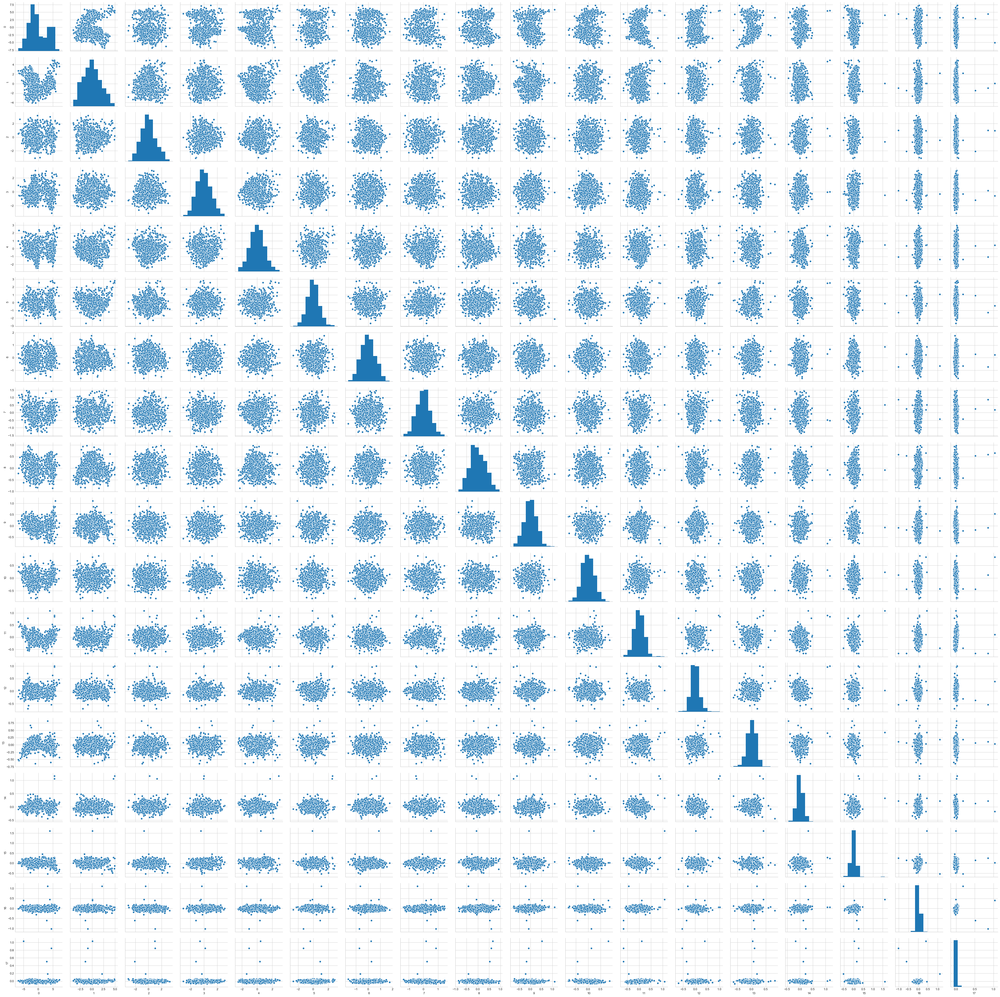

In [47]:
sns.pairplot(pd.DataFrame(Xpca))

##### Only 11 variable shown independent cloud formation and variable from index 12 to 17 not seen any relevance and not significance for analysis.

In [48]:
print(pca.explained_variance_)

[9.79297570e+00 3.37710644e+00 1.20873054e+00 1.13659560e+00
 8.96286859e-01 6.58293128e-01 3.23056525e-01 2.26906613e-01
 1.12741686e-01 7.62069059e-02 6.18393099e-02 4.42420969e-02
 2.99919142e-02 2.67735138e-02 1.94537446e-02 1.77191935e-02
 1.01216098e-02 3.12610726e-03]


In [49]:
print(pca.explained_variance_ratio_)

[5.43385012e-01 1.87386253e-01 6.70690992e-02 6.30665320e-02
 4.97324675e-02 3.65268566e-02 1.79255090e-02 1.25904175e-02
 6.25572293e-03 4.22850947e-03 3.43129149e-03 2.45487103e-03
 1.66416799e-03 1.48558789e-03 1.07943424e-03 9.83188815e-04
 5.61620004e-04 1.73459006e-04]


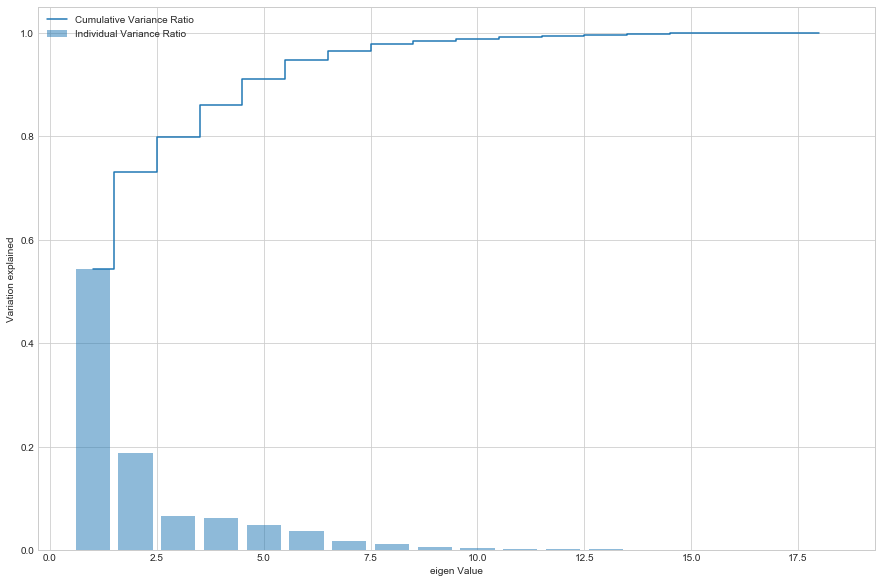

In [50]:
plt.figure(figsize=(15,10))
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center',label='Individual Variance Ratio')
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_), where='mid', label='Cumulative Variance Ratio')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.legend(loc = 'best')
plt.show()

##### From above plot infered that at upto 8 dimension able cover nearly 95 % of variance of data frame, so we can take only 8 dimension for further analysis

### K-Mean Cluster Application

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

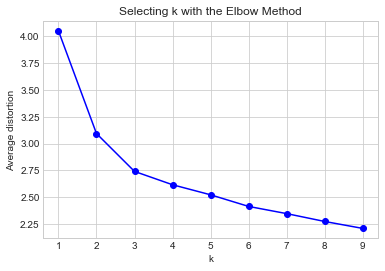

In [51]:
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans

clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(X1Scaled)
    prediction=model.predict(X1Scaled)
    meanDistortions.append(sum(np.min(cdist(XScaled, model.cluster_centers_, 'euclidean'), axis=1)) / X1Scaled.shape[0])


plt.plot(clusters, meanDistortions, 'bo-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


##### Bend is coming at K=3, Try K=3 cluster

In [52]:
#  K = 3
final_model=KMeans(3)
final_model.fit(X1Scaled)
prediction=final_model.predict(X1Scaled)

#Append the prediction 
vdf2["GROUP"] = prediction
X1Scaled["GROUP"] = prediction
print("Groups Assigned : \n")
vdf2.head()

Groups Assigned : 



C:\Users\bappa.bhalsing\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class,GROUP
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,1,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,1,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,2,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,1,2
5,107,44.0,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,3,1


In [53]:
VClust = vdf2.groupby(['GROUP'])
VClust.mean()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
GROUP,,,,,,,,,,,,,,,,,,,
0,85.995652,41.465217,67.886957,131.513043,56.908696,7.008696,142.869565,47.795652,18.639130,140.552174,163.173913,300.391304,160.904348,78.160870,5.773913,10.286957,182.434783,187.321739,2.004348
1,102.988142,52.011858,101.158103,201.003953,62.383399,9.581028,211.920949,31.426877,23.932806,164.039526,226.185771,668.324111,209.865613,71.833992,6.837945,15.075099,188.853755,196.873518,2.181818
2,91.733333,41.590909,77.530303,167.863636,63.239394,7.778788,154.030303,43.336364,19.357576,140.781818,175.854545,359.839394,156.551515,67.845455,5.951515,12.354545,193.648485,200.645455,1.915152


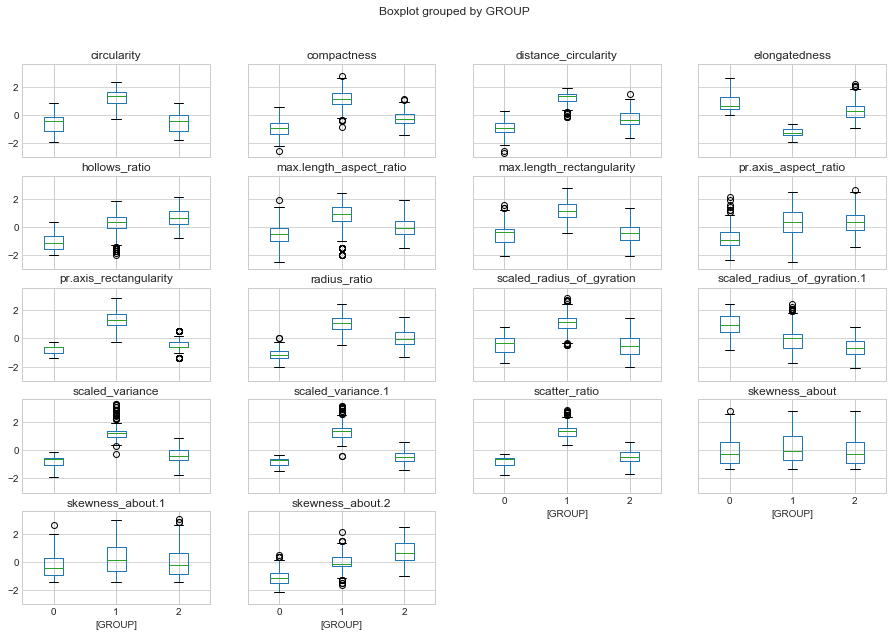

In [54]:
X1Scaled.boxplot(by='GROUP', layout = (5,4),figsize=(15,10));

Outliers are visible in New Data Frame after grouping into 3 clusters

### Dimenssion Reduction(8)

In [55]:
pca9 = PCA(n_components=8, random_state=100)
pca9.fit(XScaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=100,
    svd_solver='auto', tol=0.0, whiten=False)

In [56]:
print(pca9.explained_variance_)

[9.8075092  3.77269575 1.20894358 1.14783147 0.90110459 0.66366855
 0.33271958 0.26202618]


In [57]:

print(pca9.explained_variance_ratio_)
Xpca9 = pca9.transform(XScaled)

[0.52455901 0.20178432 0.06466089 0.06139228 0.04819598 0.03549661
 0.01779566 0.01401459]


In [58]:
Xpca9

array([[ 0.63014888, -0.89162281, -0.58134123, ..., -1.76015683,
         0.35420815, -0.09480808],
       [-1.48666585, -0.61457559, -0.23340563, ...,  0.03199657,
         0.15082914, -0.88235592],
       [ 3.96007351,  0.34539216, -1.2243495 , ..., -0.69470427,
        -0.8116278 , -0.24393786],
       ...,
       [ 5.18078348, -0.01623041, -0.59444466, ...,  0.18510059,
        -0.99965041,  0.24780473],
       [-3.27646929, -1.37958485,  1.93238401, ...,  0.05802193,
         0.4898095 , -0.58448893],
       [-5.0571452 ,  0.6898001 ,  1.33021627, ...,  0.27583812,
         0.09603386,  0.87906198]])

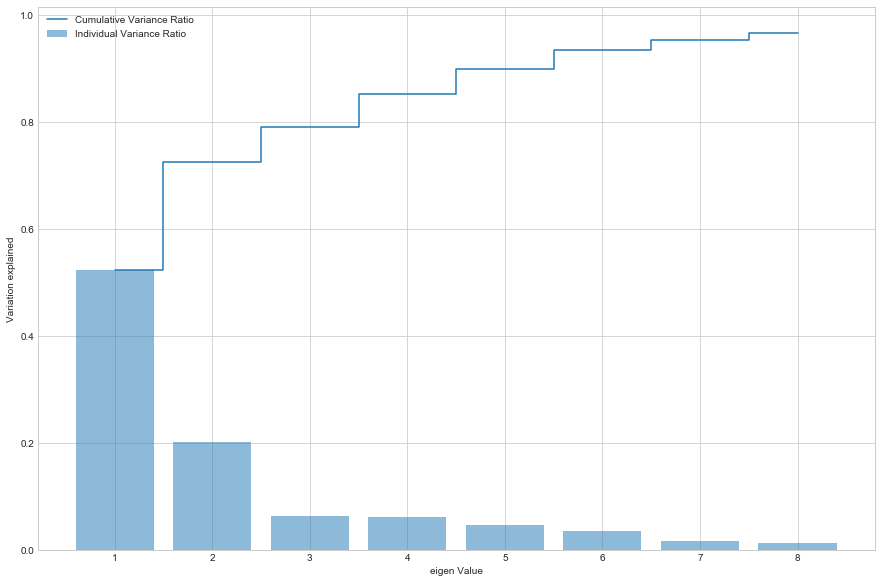

In [59]:
plt.figure(figsize=(15,10))
plt.bar(list(range(1,9)),pca9.explained_variance_ratio_,alpha=0.5, align='center',label='Individual Variance Ratio')
plt.step(list(range(1,9)),np.cumsum(pca9.explained_variance_ratio_), where='mid', label='Cumulative Variance Ratio')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.legend(loc = 'best')
plt.show()

##### upto 8th eigen value we able to cover 95 % variance of data.

In [60]:
pca9df=pd.DataFrame(Xpca9)
pca9df.head()

,0,1,2,3,4,5,6,7
0,0.630149,-0.891623,-0.581341,0.652160,-0.865834,-1.760157,0.354208,-0.094808
1,-1.486666,-0.614576,-0.233406,-1.218488,-0.173814,0.031997,0.150829,-0.882356
2,3.960074,0.345392,-1.224349,-0.212469,0.890101,-0.694704,-0.811628,-0.243938
3,-1.492259,-3.178324,-0.446863,-0.474425,-0.635700,0.372730,-0.169757,0.104765
4,5.428266,4.502661,1.250327,0.287618,1.873566,2.622878,0.051446,-1.122908


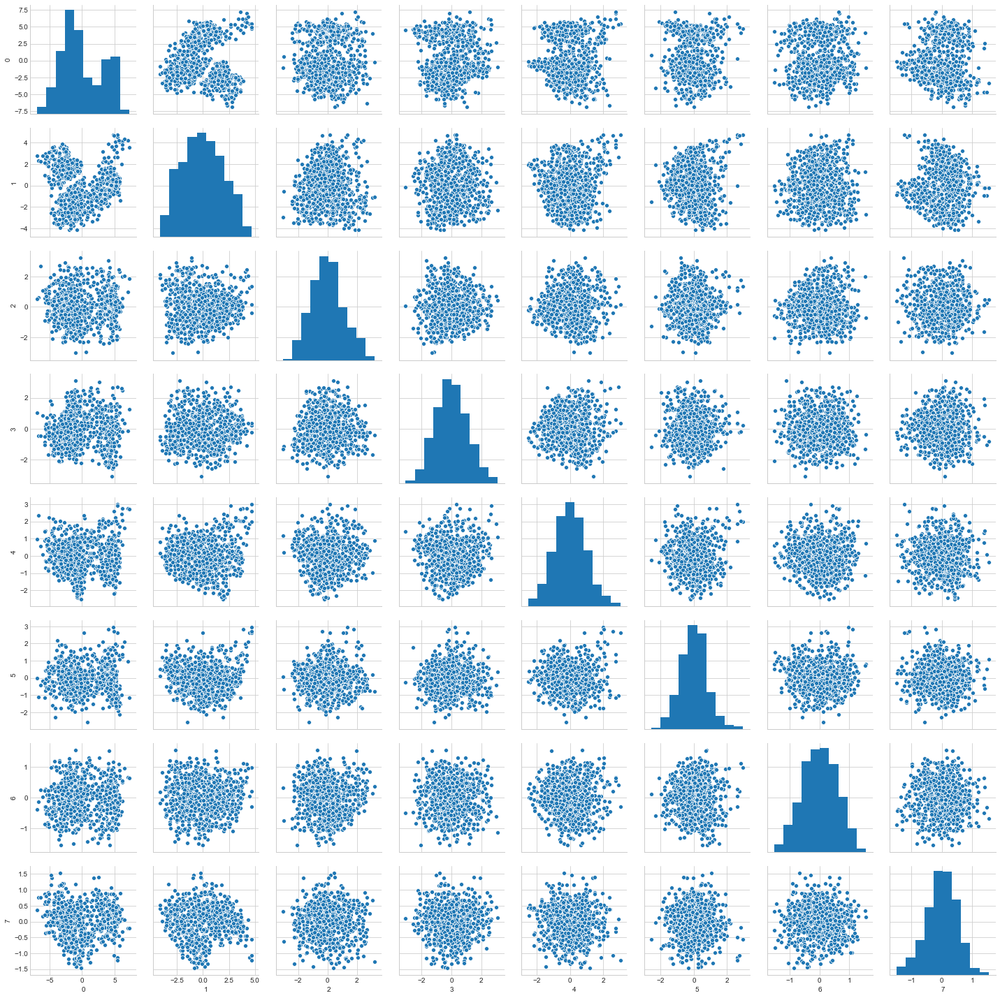

In [61]:
sns.pairplot(pd.DataFrame(pca9df))

##### After reduction of dimenssion all variable are become independent and clearly forms clouds in pair plots
##### Diagonal ( Density) Plot distribution is perfectly normal

### SVC ON PCA Data: ( First on Reduced dimenssion data frame)

In [62]:
clf1 = svm.SVC(gamma=0.025, C=3)   

In [63]:
pca_X_train,pca_X_test,pca_y_train,pca_y_test = train_test_split(pca9df,y,test_size=0.30,random_state=100)

##### Data splited in 30 % Test size and 70 % train size.

In [64]:
pca_y_test.shape

(244,)

In [65]:
pca_X_test.shape

(244, 8)

In [66]:
pca_X_train.shape

(569, 8)

In [67]:
clf1.fit(pca_X_train , pca_y_train)

SVC(C=3, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.025, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [68]:
pca_y_pred = clf1.predict(pca_X_test)

In [69]:
Test_AccuracyReduced_dim=clf1.score(pca_X_test, pca_y_test)
print('Test Accuracy of Data Set is %.4f' %Test_AccuracyReduced_dim)

Test Accuracy of Data Set is 0.9344


In [70]:
Train_AccuracyReduced_dim=clf1.score(pca_X_train, pca_y_train)
print('Test Accuracy of Data Set is %.4f' %Train_AccuracyReduced_dim)

Test Accuracy of Data Set is 0.9578


In [71]:
print(classification_report(pca_y_test,pca_y_pred))

              precision    recall  f1-score   support

           1       0.93      0.90      0.91        59
           2       0.94      0.95      0.95       123
           3       0.92      0.94      0.93        62

    accuracy                           0.93       244
   macro avg       0.93      0.93      0.93       244
weighted avg       0.93      0.93      0.93       244



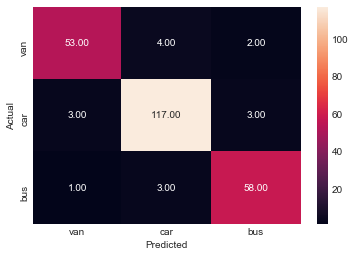

[[ 53   4   2]
 [  3 117   3]
 [  1   3  58]]


In [72]:
cm1 = confusion_matrix( pca_y_test, pca_y_pred, [1,2,3] )
sns.heatmap(cm1, annot=True,  fmt='.2f', xticklabels = ['van','car','bus'] , yticklabels = ['van','car','bus'] )
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
print(cm1)


Confusion Matrix inference

   - Our model on this case has correctly classified 53 van out of 59 actuals vans and has errored in 6 case where 4 Van classify as Car and 2 classify as Bus  
   - Model has correcly classified 117 cars and wrongly classify 3 Van and Bus each
   - Model has correctly classified 58 buses , It has classifying wrongly  buses to be 3 car &  a van

#### K Fold Cross Validation

In [73]:
kfold1 = KFold(n_splits=50, random_state=100)

C:\Users\bappa.bhalsing\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [74]:
scores1 = cross_val_score(clf1, pca9df, y, cv=kfold1)
scores1

array([0.94117647, 0.82352941, 1.        , 1.        , 0.82352941,
       1.        , 1.        , 1.        , 1.        , 0.94117647,
       1.        , 0.88235294, 0.88235294, 1.        , 1.        ,
       0.8125    , 0.8125    , 0.9375    , 1.        , 0.9375    ,
       0.9375    , 0.8125    , 0.875     , 0.9375    , 0.9375    ,
       1.        , 0.9375    , 0.9375    , 0.9375    , 0.9375    ,
       0.9375    , 0.9375    , 1.        , 0.9375    , 0.875     ,
       0.8125    , 0.8125    , 0.9375    , 1.        , 0.9375    ,
       0.9375    , 1.        , 1.        , 0.875     , 0.9375    ,
       0.9375    , 1.        , 0.875     , 1.        , 0.875     ])

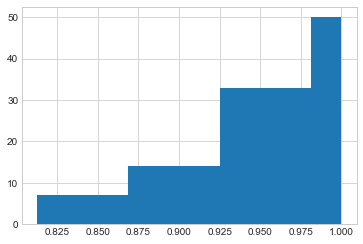

95.0% confidence interval is 81.2% and 100.0%


In [75]:
# plot scores
plt.hist(scores1, cumulative=True)
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p1 = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(scores1, p1))  
p1 = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(scores1, p1))
print('%.1f%% confidence interval is %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [76]:
A1 = scores1.mean()
A1

0.9333823529411766

In [77]:
B1=scores1.std()
B1

0.062498442887177603

In [78]:
print("K Fold Cross Validation Accuracy of PCA (Reduced Dimension): %0.2f (+/- %0.2f)" % (scores1.mean(), scores1.std() * 1.96))

K Fold Cross Validation Accuracy of PCA (Reduced Dimension): 0.93 (+/- 0.12)


### SVM on Orginal PCA Data

In [79]:
Opca_X_train,Opca_X_test,Opca_y_train,Opca_y_test = train_test_split(XScaled,y,test_size=0.30,random_state=100)

In [80]:
Opca_X_train.shape

(569, 19)

In [81]:
Opca_X_test.shape

(244, 19)

In [82]:
svc = svm.SVC(gamma=0.025, C=3)  

In [83]:
svc.fit(Opca_X_train,Opca_y_train)

SVC(C=3, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.025, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [84]:
oy_predict = svc.predict(Opca_X_test)

In [85]:
Test_AccuracyOri_dim=svc.score(Opca_X_test, Opca_y_test)
print('Test Accuracy of Data Set is %.4f' %Test_AccuracyOri_dim)

Test Accuracy of Data Set is 0.9754


In [86]:
Train_AccuracyOri_dim=svc.score(Opca_X_train, Opca_y_train)
print('Test Accuracy of Data Set is %.4f' %Train_AccuracyOri_dim)

Test Accuracy of Data Set is 0.9842


In [87]:
from sklearn.metrics import classification_report


In [88]:
print(classification_report(Opca_y_test,oy_predict))


              precision    recall  f1-score   support

           1       0.97      0.97      0.97        59
           2       0.99      0.98      0.98       123
           3       0.95      0.98      0.97        62

    accuracy                           0.98       244
   macro avg       0.97      0.98      0.97       244
weighted avg       0.98      0.98      0.98       244



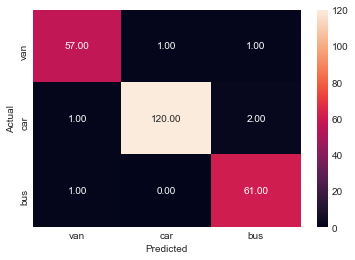

[[ 57   1   1]
 [  1 120   2]
 [  1   0  61]]


In [89]:
cm2 = confusion_matrix( Opca_y_test, oy_predict, [1,2,3] )
sns.heatmap(cm2, annot=True,  fmt='.2f', xticklabels = ['van','car','bus'] , yticklabels = ['van','car','bus'] )
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
print(cm2)

Confusion Matrix inference

   - Our model on this case has correctly classified 57 van out of 59 actuals vans and wrongly classify 1 Card and 1 Bus
   - Model has correcly classified 120 cars and wrongly classify 1 Van and 2 Bus
   - Model has correctly classified 61 buses , It has classifying wrongly  buses to be a van

#### K Fold Cross Validation

In [90]:
kfold2 = KFold(n_splits=50, random_state=100)
scores2 = cross_val_score(svc,XScaled, y, cv=kfold2)
scores2

C:\Users\bappa.bhalsing\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


array([1.        , 0.82352941, 1.        , 0.88235294, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 0.94117647, 0.94117647, 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       0.9375    , 0.9375    , 1.        , 1.        , 1.        ,
       1.        , 0.9375    , 1.        , 0.9375    , 1.        ,
       1.        , 0.9375    , 1.        , 1.        , 0.9375    ,
       0.875     , 0.9375    , 1.        , 1.        , 1.        ,
       0.9375    , 1.        , 1.        , 0.9375    , 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.9375    ])

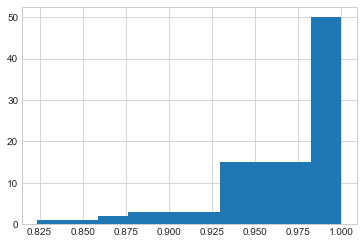

95.0% confidence interval is 87.7% and 100.0%


In [91]:
# plot scores
plt.hist(scores2,cumulative=True )
plt.show()
# confidence intervals
alpha = 0.95                             # for 95% confidence 
p2 = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(scores2, p2))  
p2 = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(scores2, p2))
print('%.1f%% confidence interval is %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [92]:
A2 = scores2.mean()
A2

0.9767647058823531

In [93]:
B2=scores2.std()
B2

0.039899039975962586

In [94]:
print("K Fold Cross Validation Accuracy of PCA (Original Dimension): %0.3f (+/- %0.3f)" % (scores2.mean(), scores2.std() * 1.96))

K Fold Cross Validation Accuracy of PCA (Original Dimension): 0.977 (+/- 0.078)


### Conclusion Summary

In [95]:
Conclusion = pd.DataFrame({'Model' : ['SVM on Raw Data', 'SVM on PCA(original Data)', "SVM on PCA(Reduced Dimension)"],
                          'Accuracy on Test': [Test_Orinal_Accuracy ,Test_AccuracyOri_dim ,Test_AccuracyReduced_dim ],
                          'Accuracy on Train' : [Train_Orinal_Accuracy ,Train_AccuracyOri_dim,Train_AccuracyReduced_dim ],
                          'Avg of Cross-Validation':[A,A2,A1]})
Conclusion

,Model,Accuracy on Test,Accuracy on Train,Avg of Cross-Validation
0,SVM on Raw Data,0.540984,1.000000,0.545882
1,SVM on PCA(original Data),0.975410,0.984183,0.976765
2,SVM on PCA(Reduced Dimension),0.934426,0.957821,0.933382


##### Inference has seen that model is tunned and improved over original data sets after application PCA on Data frame.
##### After reduced dimension Accuracy score reduced slightly but result is impresive enough to cosider it for further process of developement as weighted average and macro average  result of  classification report  is equivalent 

### Score comparison and Final Conclusion

###  Classification Report of Orginal Data Set 
              precision    recall  f1-score   support

           1       1.00      0.03      0.07        59
           2       0.52      1.00      0.69       123
           3       1.00      0.11      0.20        62

     accuracy 0.54       
   - macro avg       0.84      0.38      0.32       
- weighted avg       0.76      0.54      0.41       
      
           
           Van & Bus has seen 100 % Precision while Car has seen 52 %
           Other Parameter like Recall, f1 Score among class category has seen varied score and such models are not suitable for prodcution environment
           
        

### Classification Report of Data set after reduced dimension
           
                 precision    recall  f1-score   support

           1       0.93      0.90      0.91        59
           2       0.94      0.95      0.95       123
           3       0.92      0.94      0.93        62

    accuracy  0.93       
   - macro avg       0.93      0.93      0.93       
- weighted avg       0.93      0.93      0.93         
           
           Precision score of Car category improved from 52 % to 94 % over orinial data sets ( without PCA)
           Recall, f1 Score is seen in balalced state
           
           Even Macro Average and Weighted average does not seen any difference indicates that model has been tunned for process of development

**Close of Project**

## Thanks for assessing this project 